# GANomaly
- 2020.08.16 : gen 15 / lr 1e-5

# 개발일지
- 2020.08.15 : 분율 추출 구현 / 이상치 상관계수 추출 구현 / 모델 save, load 구현
- 2020.08.16 : anomaly detect 이미지 저장 구현 / 티타늄(Ti64) 상대 밀도 계산 구현

--- 

# Module

In [1]:
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
from torchvision.utils import save_image
import os
import numpy as np

import torchvision.datasets as dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils

# Graph & Animation
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Hyper Parameter

In [2]:
latent_size = 100  # z벡터의 잠재공간(latent space)의 크기
workers = 4    # 0일때, 약 20% 사용 4일 경우 메모리 100%
img_size = 64
channel = 1
epochs = 100
batch_size = 64
learning_rate = 1e-5

# Data and Device

In [3]:
# 이미지 경로, 이미지들 리사이즈 및 텐서형태로 만들기
#data_root = "../../dataset/train"
CFRP_aug_data_root = "../../dataset/aug_train/aug_CFRP"

data_set = dataset.ImageFolder(root = CFRP_aug_data_root, # data_root,
                           transform = transforms.Compose([
                                  #transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

print("size of dataset :", len(data_set))

# 배치로 나누고 셔플하기
data_loader = torch.utils.data.DataLoader(data_set, batch_size = batch_size,
                                         shuffle = True, num_workers = workers, drop_last=True)

# Device setting (GPU or CPU)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print("device :", device)

size of dataset : 1368
device : cuda:0


# MODEL

In [4]:
# GANomaly : Generative Adversarial Networks Model using Decoder with AutoEncoder

# === Decoder 모델 ===
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        
        # Batch Normalization 유무에 따른 G_block 정의
        def DC_conv_block(in_features, out_features):
            block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
            ]
            return block
        
        def DC_deconv_block(in_features, out_features, FIRST=True):
            if FIRST:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 1, 0, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.ConvTranspose2d(in_features, out_features, 4, 2, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            return block
        
        
        # ======================= 픽셀 분포 생성 layer ======================= 
        self.DC_gen_distribution = nn.Sequential(
            # ------ input is latent_size 100 ------ 
            *DC_deconv_block(latent_size, img_size*8, FIRST=True),
            # ------ state size is 512x4x4 ------ 
            *DC_conv_block(img_size*8, img_size*8),
            # ------ state size is 512x4x4 ------   
            *DC_deconv_block(img_size*8, img_size*4, FIRST=False),
            # ------ state size is 256x8x8 ------ 
            *DC_conv_block(img_size*4, img_size*4),
            # ------ state size is 256x8x8 ------ 
            *DC_deconv_block(img_size*4, img_size*2, FIRST=False),
            # ------ state size is 128x16x16 ------ 
            *DC_conv_block(img_size*2, img_size*2),
            # ------ state size is 128x16x16 ------ 
            *DC_deconv_block(img_size*2, img_size, FIRST=False),
        )
        
        # =================== 가짜 이미지 생성 layer =================== 
        self.DC_gen_fake_img = nn.Sequential(
            # ------ state size is 64x32x32 ------ 
            nn.ConvTranspose2d(img_size, 1, 4, 2, 1, bias=False),
            nn.Tanh() # 픽셀값의 범위 : -1 ~ 1로 두기 위해서
            # ------ state size is 1x64x64 ------ 
        )
    
    def forward(self, input):
        distribution = self.DC_gen_distribution(input)
        fake_img = self.DC_gen_fake_img(distribution)
        
        return fake_img


# === Discriminator 모델 ===
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        # Batch Normalization 유무에 따른 D_block 정의
        def D_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 layer ==============
        self.D_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *D_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *D_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *D_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *D_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *D_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *D_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *D_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *D_block(img_size*8, img_size*8, MP=True),
        )
        
        # ===================== 이진 분류 layer =====================
        self.D_classification = nn.Sequential(        
            # ------- state size 512x4x4 ------- 
            nn.Conv2d(img_size*8, channel, 4, 1, 0, bias=False),
            #nn.Linear(fms*8*4*4, 1, bias=False),
            nn.Sigmoid()        
        )
        
    def forward(self, input):
        feature = self.D_extract_feature(input)
        classification = self.D_classification(feature)
        
        return classification, feature 


# === Encoder Model ===
class Encoder(nn.Module):
    def __init__(self):
        super(Encoder, self).__init__()
        
        def EC_block(in_features, out_features, MP=True):
            if MP:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU()
                ]
            else:
                block = [
                    nn.Conv2d(in_features, out_features, 3, 1, 1, bias=False),
                    nn.BatchNorm2d(out_features),
                    nn.ELU(),
                    nn.MaxPool2d(2)
                ]
            return block
        
        # ============== Feature 추출 ==============
        self.EC_extract_feature = nn.Sequential(
            # ------ input is 1 x 64 x 64 ------ 
            *EC_block(channel, img_size, MP=False),
            # ------ input is 64 x 64 x 64 ------ 
            *EC_block(img_size, img_size, MP=True),
            # ------ state is 64 x 32 x 32 ------ 
            *EC_block(img_size, img_size*2, MP=False),
            # ------ state is 128 x 32 x 32 ------ 
            *EC_block(img_size*2, img_size*2, MP=True),
            # ------ state is 128 x 16 x 16 ------ 
            *EC_block(img_size*2, img_size*4, MP=False),
            # ------ state is 256 x 16 x 16 ------ 
            *EC_block(img_size*4, img_size*4, MP=True),
            # ------ state is 256 x 8 x 8 ------ 
            *EC_block(img_size*4, img_size*8, MP=False),
            # ------ state is 512 x 8 x 8 ------ 
            *EC_block(img_size*8, img_size*8, MP=True),
        )
        
        # =============== Encoder Training layer ===============
        self.EC_validate = nn.Sequential(
            # -------state is 512 x 4 x 4-------
            nn.Conv2d(img_size*8, latent_size, 4, 1, 0, bias=False),
            nn.Tanh()
            # -------state is 100 x 97 x 97-------
        )
        
    def forward(self, input):
        feature = self.EC_extract_feature(input)
        validity = self.EC_validate(feature)
        
        return validity

# Loss & Optim

In [5]:
# DC and D 무게 초기화, classname 에 찾는 name가 없다면 -1 ,
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# D,DC,EC 네트워크 모델 객체 선언
D = Discriminator().to(device)
DC = Decoder().to(device)
EC = Encoder().to(device)

# weight initialize/ nn.Module 클래스 안에 apply 함수가 정의되 있음, 각 함수들에 다 적용 하게한다
D.apply(weights_init)
DC.apply(weights_init)
EC.apply(weights_init)

# Binary cross entropy loss and optimizer
DCGAN_criterion = nn.BCELoss()
AE_criterion = nn.MSELoss()

# latent vector에 배치 사이즈 64를 적용
# 학습한 DC로 새로운 것 만들어서 결과 확인 할때 사용
noise_z = torch.randn(img_size, latent_size, 1, 1, device = device)

# D와 DC에 대해 두가지 최적화 설정
D_optimizer = torch.optim.Adam(D.parameters(), lr = learning_rate, betas=(0.5,0.999))
DC_optimizer = torch.optim.Adam(DC.parameters(), lr = learning_rate, betas=(0.5,0.999))
EC_optimizer = torch.optim.Adam(EC.parameters(), lr = learning_rate, betas=(0.5,0.999))

#print(D)
#print(DC)
#print(EC)

def reset_grad():
    D_optimizer.zero_grad()
    DC_optimizer.zero_grad()

---

# Train DCGAN

In [6]:
img_list = []
DC_losses = []
D_losses = []
iters = 0

def train_DCGAN(epoch, learning_DC_per_D = 4):
    global epochs
    global iters
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        # Train D
        real_img = data[0].to(device) # image size: 64x1x64x64(batch, channel, width, height)
        b_size = real_img.size(0) # b_size = 64
        real_labels = torch.ones(b_size, 1).to(device)
        fake_labels = torch.zeros(b_size, 1).to(device)
        
        # (--------------------------real-----------------------------)
        real_classification, _ = D(real_img) # output = D(x)
        real_loss = DCGAN_criterion(real_classification, real_labels) # D(x)=1일 때의 loss
        real_score = real_classification
        D_x = real_score.mean().item() 
            
        # (--------------------------fake-----------------------------)
        z = torch.randn(b_size, latent_size, 1, 1).to(device) # z size :64x100x1x1
        fake_img = DC(z)
        fake_classification, _ = D(fake_img) # output = D(DC(z))
        fake_loss = DCGAN_criterion(fake_classification, fake_labels) # D(DC(z))=0일 때의 loss
        fake_score = fake_classification
        D_DC_z1 = fake_score.mean().item()

        # (------------------Backprop and optimize---------------------)
        D_loss = real_loss + fake_loss
        reset_grad()
        D_loss.backward()
        D_optimizer.step() # D(x)=1, D(DC(z))=0이어야 D가 최적

        
        # Train DC
        #z = torch.randn(b_size,latent_size,1,1,device=device) # z size :64x100x1x1
        for k in range(learning_DC_per_D):
            fake_img = DC(z)
            fake_classification,_ = D(fake_img)  # output : D(DC(z))
            D_DC_z2 = fake_classification.mean().item()
            DC_loss = DCGAN_criterion(fake_classification, real_labels) # D(DC(z))=1일 때의 loss=log(D(DC(z)))

            # (------------------Backprop and optimize---------------------)
            reset_grad()
            DC_loss.backward()
            DC_optimizer.step() # D(DC(z))=1 이어야 DC가 최적
            # ==> D(DC(z))의 값이 0.5로 수렴해야 한다.
        
        
        # print
        print('[%d/%d][%d/%d]\n- D_loss : %.4f / DC_loss : %.4f\n- D(x):%.4f / D(DC(z1)) : %.4f / D(DC(z2)) : %.4f' 
                   %(epoch+1, epochs, i, len(data_loader),D_loss.item(),
                     DC_loss.item(),D_x,D_DC_z1,D_DC_z2))
        
        # Save Losses for plotting later
        DC_losses.append(DC_loss.item())
        D_losses.append(D_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(noise_z).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [7]:
for epoch in range(epochs):
    train_DCGAN(epoch, learning_DC_per_D = 15)

/home/piai/anaconda3/envs/pytorch/lib/python3.6/site-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([64, 1])) that is different to the input size (torch.Size([64, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[1/100][0/21]
- D_loss : 1.3759 / DC_loss : 0.6219
- D(x):0.5005 / D(DC(z1)) : 0.4952 / D(DC(z2)) : 0.5370
[1/100][1/21]
- D_loss : 1.3671 / DC_loss : 0.6180
- D(x):0.5016 / D(DC(z1)) : 0.4918 / D(DC(z2)) : 0.5391
[1/100][2/21]
- D_loss : 1.3665 / DC_loss : 0.6185
- D(x):0.5001 / D(DC(z1)) : 0.4899 / D(DC(z2)) : 0.5388
[1/100][3/21]
- D_loss : 1.3626 / DC_loss : 0.6219
- D(x):0.4992 / D(DC(z1)) : 0.4871 / D(DC(z2)) : 0.5370
[1/100][4/21]
- D_loss : 1.3553 / DC_loss : 0.6253
- D(x):0.4999 / D(DC(z1)) : 0.4840 / D(DC(z2)) : 0.5351
[1/100][5/21]
- D_loss : 1.3501 / DC_loss : 0.6310
- D(x):0.4991 / D(DC(z1)) : 0.4805 / D(DC(z2)) : 0.5321
[1/100][6/21]
- D_loss : 1.3462 / DC_loss : 0.6320
- D(x):0.4989 / D(DC(z1)) : 0.4783 / D(DC(z2)) : 0.5316
[1/100][7/21]
- D_loss : 1.3423 / DC_loss : 0.6350
- D(x):0.4992 / D(DC(z1)) : 0.4765 / D(DC(z2)) : 0.5300
[1/100][8/21]
- D_loss : 1.3420 / DC_loss : 0.6345
- D(x):0.4999 / D(DC(z1)) : 0.4771 / D(DC(z2)) : 0.5302
[1/100][9/21]
- D_loss : 1.3377 / DC_

[4/100][14/21]
- D_loss : 1.5331 / DC_loss : 0.6177
- D(x):0.4715 / D(DC(z1)) : 0.5420 / D(DC(z2)) : 0.5392
[4/100][15/21]
- D_loss : 1.5233 / DC_loss : 0.6249
- D(x):0.4727 / D(DC(z1)) : 0.5386 / D(DC(z2)) : 0.5353
[4/100][16/21]
- D_loss : 1.5260 / DC_loss : 0.6301
- D(x):0.4677 / D(DC(z1)) : 0.5350 / D(DC(z2)) : 0.5325
[4/100][17/21]
- D_loss : 1.5146 / DC_loss : 0.6357
- D(x):0.4702 / D(DC(z1)) : 0.5321 / D(DC(z2)) : 0.5296
[4/100][18/21]
- D_loss : 1.5094 / DC_loss : 0.6398
- D(x):0.4702 / D(DC(z1)) : 0.5297 / D(DC(z2)) : 0.5274
[4/100][19/21]
- D_loss : 1.5084 / DC_loss : 0.6429
- D(x):0.4683 / D(DC(z1)) : 0.5273 / D(DC(z2)) : 0.5258
[4/100][20/21]
- D_loss : 1.4997 / DC_loss : 0.6454
- D(x):0.4707 / D(DC(z1)) : 0.5256 / D(DC(z2)) : 0.5245
[5/100][0/21]
- D_loss : 1.4972 / DC_loss : 0.6475
- D(x):0.4707 / D(DC(z1)) : 0.5244 / D(DC(z2)) : 0.5234
[5/100][1/21]
- D_loss : 1.4993 / DC_loss : 0.6493
- D(x):0.4686 / D(DC(z1)) : 0.5233 / D(DC(z2)) : 0.5224
[5/100][2/21]
- D_loss : 1.490

[8/100][7/21]
- D_loss : 1.3468 / DC_loss : 0.8071
- D(x):0.4710 / D(DC(z1)) : 0.4475 / D(DC(z2)) : 0.4462
[8/100][8/21]
- D_loss : 1.3508 / DC_loss : 0.7985
- D(x):0.4684 / D(DC(z1)) : 0.4466 / D(DC(z2)) : 0.4500
[8/100][9/21]
- D_loss : 1.3494 / DC_loss : 0.7546
- D(x):0.4729 / D(DC(z1)) : 0.4513 / D(DC(z2)) : 0.4702
[8/100][10/21]
- D_loss : 1.3859 / DC_loss : 0.7388
- D(x):0.4735 / D(DC(z1)) : 0.4715 / D(DC(z2)) : 0.4777
[8/100][11/21]
- D_loss : 1.4034 / DC_loss : 0.7346
- D(x):0.4714 / D(DC(z1)) : 0.4784 / D(DC(z2)) : 0.4797
[8/100][12/21]
- D_loss : 1.4088 / DC_loss : 0.7351
- D(x):0.4707 / D(DC(z1)) : 0.4803 / D(DC(z2)) : 0.4795
[8/100][13/21]
- D_loss : 1.4065 / DC_loss : 0.7389
- D(x):0.4713 / D(DC(z1)) : 0.4799 / D(DC(z2)) : 0.4776
[8/100][14/21]
- D_loss : 1.4056 / DC_loss : 0.7443
- D(x):0.4701 / D(DC(z1)) : 0.4780 / D(DC(z2)) : 0.4751
[8/100][15/21]
- D_loss : 1.4036 / DC_loss : 0.7510
- D(x):0.4686 / D(DC(z1)) : 0.4754 / D(DC(z2)) : 0.4719
[8/100][16/21]
- D_loss : 1.392

[11/100][20/21]
- D_loss : 1.2874 / DC_loss : 0.8286
- D(x):0.4862 / D(DC(z1)) : 0.4321 / D(DC(z2)) : 0.4367
[12/100][0/21]
- D_loss : 1.3018 / DC_loss : 0.8184
- D(x):0.4839 / D(DC(z1)) : 0.4376 / D(DC(z2)) : 0.4411
[12/100][1/21]
- D_loss : 1.2867 / DC_loss : 0.8121
- D(x):0.4949 / D(DC(z1)) : 0.4418 / D(DC(z2)) : 0.4439
[12/100][2/21]
- D_loss : 1.3165 / DC_loss : 0.8055
- D(x):0.4829 / D(DC(z1)) : 0.4446 / D(DC(z2)) : 0.4469
[12/100][3/21]
- D_loss : 1.3137 / DC_loss : 0.7994
- D(x):0.4869 / D(DC(z1)) : 0.4477 / D(DC(z2)) : 0.4496
[12/100][4/21]
- D_loss : 1.3175 / DC_loss : 0.7994
- D(x):0.4873 / D(DC(z1)) : 0.4502 / D(DC(z2)) : 0.4496
[12/100][5/21]
- D_loss : 1.3082 / DC_loss : 0.8029
- D(x):0.4917 / D(DC(z1)) : 0.4501 / D(DC(z2)) : 0.4480
[12/100][6/21]
- D_loss : 1.3178 / DC_loss : 0.8090
- D(x):0.4856 / D(DC(z1)) : 0.4484 / D(DC(z2)) : 0.4453
[12/100][7/21]
- D_loss : 1.3120 / DC_loss : 0.8133
- D(x):0.4860 / D(DC(z1)) : 0.4457 / D(DC(z2)) : 0.4434
[12/100][8/21]
- D_loss : 1

[15/100][12/21]
- D_loss : 1.1941 / DC_loss : 0.9828
- D(x):0.4904 / D(DC(z1)) : 0.3819 / D(DC(z2)) : 0.3743
[15/100][13/21]
- D_loss : 1.1821 / DC_loss : 1.0101
- D(x):0.4906 / D(DC(z1)) : 0.3747 / D(DC(z2)) : 0.3642
[15/100][14/21]
- D_loss : 1.1698 / DC_loss : 1.0294
- D(x):0.4887 / D(DC(z1)) : 0.3645 / D(DC(z2)) : 0.3572
[15/100][15/21]
- D_loss : 1.1586 / DC_loss : 1.0369
- D(x):0.4888 / D(DC(z1)) : 0.3575 / D(DC(z2)) : 0.3546
[15/100][16/21]
- D_loss : 1.1837 / DC_loss : 1.0255
- D(x):0.4749 / D(DC(z1)) : 0.3548 / D(DC(z2)) : 0.3586
[15/100][17/21]
- D_loss : 1.1377 / DC_loss : 1.0320
- D(x):0.5003 / D(DC(z1)) : 0.3589 / D(DC(z2)) : 0.3563
[15/100][18/21]
- D_loss : 1.1508 / DC_loss : 1.0512
- D(x):0.4919 / D(DC(z1)) : 0.3566 / D(DC(z2)) : 0.3495
[15/100][19/21]
- D_loss : 1.1511 / DC_loss : 1.0625
- D(x):0.4868 / D(DC(z1)) : 0.3498 / D(DC(z2)) : 0.3456
[15/100][20/21]
- D_loss : 1.1511 / DC_loss : 1.0561
- D(x):0.4840 / D(DC(z1)) : 0.3460 / D(DC(z2)) : 0.3478
[16/100][0/21]
- D_

[19/100][4/21]
- D_loss : 1.1924 / DC_loss : 0.9323
- D(x):0.5048 / D(DC(z1)) : 0.3987 / D(DC(z2)) : 0.3937
[19/100][5/21]
- D_loss : 1.1691 / DC_loss : 0.9454
- D(x):0.5126 / D(DC(z1)) : 0.3938 / D(DC(z2)) : 0.3885
[19/100][6/21]
- D_loss : 1.1655 / DC_loss : 0.9590
- D(x):0.5102 / D(DC(z1)) : 0.3887 / D(DC(z2)) : 0.3833
[19/100][7/21]
- D_loss : 1.1541 / DC_loss : 0.9721
- D(x):0.5116 / D(DC(z1)) : 0.3835 / D(DC(z2)) : 0.3783
[19/100][8/21]
- D_loss : 1.1576 / DC_loss : 0.9841
- D(x):0.5057 / D(DC(z1)) : 0.3785 / D(DC(z2)) : 0.3738
[19/100][9/21]
- D_loss : 1.1307 / DC_loss : 0.9956
- D(x):0.5157 / D(DC(z1)) : 0.3740 / D(DC(z2)) : 0.3695
[19/100][10/21]
- D_loss : 1.1440 / DC_loss : 1.0047
- D(x):0.5055 / D(DC(z1)) : 0.3697 / D(DC(z2)) : 0.3662
[19/100][11/21]
- D_loss : 1.1200 / DC_loss : 1.0134
- D(x):0.5150 / D(DC(z1)) : 0.3663 / D(DC(z2)) : 0.3630
[19/100][12/21]
- D_loss : 1.1182 / DC_loss : 1.0226
- D(x):0.5134 / D(DC(z1)) : 0.3632 / D(DC(z2)) : 0.3597
[19/100][13/21]
- D_loss 

[22/100][17/21]
- D_loss : 1.2687 / DC_loss : 0.8438
- D(x):0.4947 / D(DC(z1)) : 0.4315 / D(DC(z2)) : 0.4301
[22/100][18/21]
- D_loss : 1.2346 / DC_loss : 0.8430
- D(x):0.5112 / D(DC(z1)) : 0.4308 / D(DC(z2)) : 0.4304
[22/100][19/21]
- D_loss : 1.2228 / DC_loss : 0.8528
- D(x):0.5177 / D(DC(z1)) : 0.4312 / D(DC(z2)) : 0.4262
[22/100][20/21]
- D_loss : 1.2243 / DC_loss : 0.8712
- D(x):0.5129 / D(DC(z1)) : 0.4268 / D(DC(z2)) : 0.4184
[23/100][0/21]
- D_loss : 1.2265 / DC_loss : 0.8869
- D(x):0.5049 / D(DC(z1)) : 0.4189 / D(DC(z2)) : 0.4119
[23/100][1/21]
- D_loss : 1.2127 / DC_loss : 0.9016
- D(x):0.5063 / D(DC(z1)) : 0.4125 / D(DC(z2)) : 0.4059
[23/100][2/21]
- D_loss : 1.1997 / DC_loss : 0.9080
- D(x):0.5076 / D(DC(z1)) : 0.4065 / D(DC(z2)) : 0.4033
[23/100][3/21]
- D_loss : 1.2048 / DC_loss : 0.9056
- D(x):0.5029 / D(DC(z1)) : 0.4039 / D(DC(z2)) : 0.4043
[23/100][4/21]
- D_loss : 1.2129 / DC_loss : 0.9015
- D(x):0.4998 / D(DC(z1)) : 0.4050 / D(DC(z2)) : 0.4060
[23/100][5/21]
- D_loss 

[26/100][9/21]
- D_loss : 1.1542 / DC_loss : 0.9506
- D(x):0.5192 / D(DC(z1)) : 0.3927 / D(DC(z2)) : 0.3865
[26/100][10/21]
- D_loss : 1.1468 / DC_loss : 0.9446
- D(x):0.5187 / D(DC(z1)) : 0.3875 / D(DC(z2)) : 0.3888
[26/100][11/21]
- D_loss : 1.1428 / DC_loss : 0.9335
- D(x):0.5229 / D(DC(z1)) : 0.3901 / D(DC(z2)) : 0.3932
[26/100][12/21]
- D_loss : 1.1548 / DC_loss : 0.9296
- D(x):0.5199 / D(DC(z1)) : 0.3938 / D(DC(z2)) : 0.3947
[26/100][13/21]
- D_loss : 1.1651 / DC_loss : 0.9299
- D(x):0.5162 / D(DC(z1)) : 0.3957 / D(DC(z2)) : 0.3946
[26/100][14/21]
- D_loss : 1.1671 / DC_loss : 0.9353
- D(x):0.5147 / D(DC(z1)) : 0.3950 / D(DC(z2)) : 0.3925
[26/100][15/21]
- D_loss : 1.1272 / DC_loss : 0.9382
- D(x):0.5335 / D(DC(z1)) : 0.3926 / D(DC(z2)) : 0.3913
[26/100][16/21]
- D_loss : 1.1368 / DC_loss : 0.9427
- D(x):0.5280 / D(DC(z1)) : 0.3922 / D(DC(z2)) : 0.3896
[26/100][17/21]
- D_loss : 1.1278 / DC_loss : 0.9405
- D(x):0.5310 / D(DC(z1)) : 0.3902 / D(DC(z2)) : 0.3904
[26/100][18/21]
- D_

[30/100][1/21]
- D_loss : 1.1015 / DC_loss : 0.9552
- D(x):0.5473 / D(DC(z1)) : 0.3925 / D(DC(z2)) : 0.3847
[30/100][2/21]
- D_loss : 1.0851 / DC_loss : 0.9779
- D(x):0.5500 / D(DC(z1)) : 0.3855 / D(DC(z2)) : 0.3761
[30/100][3/21]
- D_loss : 1.0774 / DC_loss : 0.9979
- D(x):0.5465 / D(DC(z1)) : 0.3767 / D(DC(z2)) : 0.3686
[30/100][4/21]
- D_loss : 1.0807 / DC_loss : 1.0057
- D(x):0.5382 / D(DC(z1)) : 0.3693 / D(DC(z2)) : 0.3658
[30/100][5/21]
- D_loss : 1.0505 / DC_loss : 1.0024
- D(x):0.5523 / D(DC(z1)) : 0.3666 / D(DC(z2)) : 0.3670
[30/100][6/21]
- D_loss : 1.0971 / DC_loss : 0.9936
- D(x):0.5283 / D(DC(z1)) : 0.3679 / D(DC(z2)) : 0.3702
[30/100][7/21]
- D_loss : 1.0707 / DC_loss : 0.9808
- D(x):0.5452 / D(DC(z1)) : 0.3711 / D(DC(z2)) : 0.3750
[30/100][8/21]
- D_loss : 1.0529 / DC_loss : 0.9788
- D(x):0.5592 / D(DC(z1)) : 0.3760 / D(DC(z2)) : 0.3758
[30/100][9/21]
- D_loss : 1.0828 / DC_loss : 0.9860
- D(x):0.5431 / D(DC(z1)) : 0.3764 / D(DC(z2)) : 0.3731
[30/100][10/21]
- D_loss : 1

[33/100][14/21]
- D_loss : 1.0829 / DC_loss : 0.8766
- D(x):0.5850 / D(DC(z1)) : 0.4211 / D(DC(z2)) : 0.4162
[33/100][15/21]
- D_loss : 1.0834 / DC_loss : 0.9074
- D(x):0.5807 / D(DC(z1)) : 0.4171 / D(DC(z2)) : 0.4036
[33/100][16/21]
- D_loss : 1.0842 / DC_loss : 0.9393
- D(x):0.5679 / D(DC(z1)) : 0.4043 / D(DC(z2)) : 0.3909
[33/100][17/21]
- D_loss : 1.0724 / DC_loss : 0.9673
- D(x):0.5624 / D(DC(z1)) : 0.3915 / D(DC(z2)) : 0.3801
[33/100][18/21]
- D_loss : 1.0585 / DC_loss : 0.9953
- D(x):0.5604 / D(DC(z1)) : 0.3806 / D(DC(z2)) : 0.3696
[33/100][19/21]
- D_loss : 1.0393 / DC_loss : 1.0205
- D(x):0.5615 / D(DC(z1)) : 0.3699 / D(DC(z2)) : 0.3604
[33/100][20/21]
- D_loss : 1.0159 / DC_loss : 1.0458
- D(x):0.5665 / D(DC(z1)) : 0.3607 / D(DC(z2)) : 0.3514
[34/100][0/21]
- D_loss : 1.0034 / DC_loss : 1.0692
- D(x):0.5656 / D(DC(z1)) : 0.3516 / D(DC(z2)) : 0.3433
[34/100][1/21]
- D_loss : 0.9885 / DC_loss : 1.0885
- D(x):0.5671 / D(DC(z1)) : 0.3436 / D(DC(z2)) : 0.3367
[34/100][2/21]
- D_lo

[37/100][6/21]
- D_loss : 1.3886 / DC_loss : 0.6391
- D(x):0.5163 / D(DC(z1)) : 0.5163 / D(DC(z2)) : 0.5280
[37/100][7/21]
- D_loss : 1.4126 / DC_loss : 0.6477
- D(x):0.4990 / D(DC(z1)) : 0.5111 / D(DC(z2)) : 0.5235
[37/100][8/21]
- D_loss : 1.4161 / DC_loss : 0.6460
- D(x):0.5076 / D(DC(z1)) : 0.5211 / D(DC(z2)) : 0.5244
[37/100][9/21]
- D_loss : 1.4161 / DC_loss : 0.6592
- D(x):0.4908 / D(DC(z1)) : 0.5047 / D(DC(z2)) : 0.5176
[37/100][10/21]
- D_loss : 1.4223 / DC_loss : 0.6773
- D(x):0.4754 / D(DC(z1)) : 0.4917 / D(DC(z2)) : 0.5082
[37/100][11/21]
- D_loss : 1.4049 / DC_loss : 0.6680
- D(x):0.4967 / D(DC(z1)) : 0.5052 / D(DC(z2)) : 0.5130
[37/100][12/21]
- D_loss : 1.3790 / DC_loss : 0.6847
- D(x):0.5006 / D(DC(z1)) : 0.4961 / D(DC(z2)) : 0.5045
[37/100][13/21]
- D_loss : 1.4044 / DC_loss : 0.6850
- D(x):0.4853 / D(DC(z1)) : 0.4935 / D(DC(z2)) : 0.5043
[37/100][14/21]
- D_loss : 1.3917 / DC_loss : 0.7055
- D(x):0.4842 / D(DC(z1)) : 0.4857 / D(DC(z2)) : 0.4941
[37/100][15/21]
- D_los

[40/100][19/21]
- D_loss : 1.3972 / DC_loss : 0.7124
- D(x):0.4807 / D(DC(z1)) : 0.4851 / D(DC(z2)) : 0.4906
[40/100][20/21]
- D_loss : 1.4213 / DC_loss : 0.7024
- D(x):0.4753 / D(DC(z1)) : 0.4914 / D(DC(z2)) : 0.4955
[41/100][0/21]
- D_loss : 1.3975 / DC_loss : 0.7053
- D(x):0.4797 / D(DC(z1)) : 0.4841 / D(DC(z2)) : 0.4942
[41/100][1/21]
- D_loss : 1.4103 / DC_loss : 0.7022
- D(x):0.4780 / D(DC(z1)) : 0.4887 / D(DC(z2)) : 0.4957
[41/100][2/21]
- D_loss : 1.4535 / DC_loss : 0.6906
- D(x):0.4651 / D(DC(z1)) : 0.4966 / D(DC(z2)) : 0.5015
[41/100][3/21]
- D_loss : 1.4153 / DC_loss : 0.6972
- D(x):0.4781 / D(DC(z1)) : 0.4913 / D(DC(z2)) : 0.4981
[41/100][4/21]
- D_loss : 1.4252 / DC_loss : 0.7050
- D(x):0.4699 / D(DC(z1)) : 0.4874 / D(DC(z2)) : 0.4943
[41/100][5/21]
- D_loss : 1.4093 / DC_loss : 0.7054
- D(x):0.4803 / D(DC(z1)) : 0.4908 / D(DC(z2)) : 0.4941
[41/100][6/21]
- D_loss : 1.4082 / DC_loss : 0.7070
- D(x):0.4804 / D(DC(z1)) : 0.4902 / D(DC(z2)) : 0.4933
[41/100][7/21]
- D_loss : 

[44/100][11/21]
- D_loss : 1.4229 / DC_loss : 0.6735
- D(x):0.4875 / D(DC(z1)) : 0.5051 / D(DC(z2)) : 0.5101
[44/100][12/21]
- D_loss : 1.3909 / DC_loss : 0.6769
- D(x):0.5020 / D(DC(z1)) : 0.5038 / D(DC(z2)) : 0.5083
[44/100][13/21]
- D_loss : 1.3942 / DC_loss : 0.6750
- D(x):0.4985 / D(DC(z1)) : 0.5019 / D(DC(z2)) : 0.5094
[44/100][14/21]
- D_loss : 1.4043 / DC_loss : 0.6804
- D(x):0.4904 / D(DC(z1)) : 0.4989 / D(DC(z2)) : 0.5066
[44/100][15/21]
- D_loss : 1.3898 / DC_loss : 0.6828
- D(x):0.4971 / D(DC(z1)) : 0.4981 / D(DC(z2)) : 0.5054
[44/100][16/21]
- D_loss : 1.4122 / DC_loss : 0.6709
- D(x):0.4934 / D(DC(z1)) : 0.5057 / D(DC(z2)) : 0.5116
[44/100][17/21]
- D_loss : 1.3925 / DC_loss : 0.6817
- D(x):0.4996 / D(DC(z1)) : 0.5021 / D(DC(z2)) : 0.5060
[44/100][18/21]
- D_loss : 1.4003 / DC_loss : 0.6753
- D(x):0.4947 / D(DC(z1)) : 0.5010 / D(DC(z2)) : 0.5093
[44/100][19/21]
- D_loss : 1.3845 / DC_loss : 0.6874
- D(x):0.4981 / D(DC(z1)) : 0.4967 / D(DC(z2)) : 0.5031
[44/100][20/21]
- D

[48/100][3/21]
- D_loss : 1.3674 / DC_loss : 0.6896
- D(x):0.5012 / D(DC(z1)) : 0.4913 / D(DC(z2)) : 0.5018
[48/100][4/21]
- D_loss : 1.3470 / DC_loss : 0.6846
- D(x):0.5147 / D(DC(z1)) : 0.4944 / D(DC(z2)) : 0.5043
[48/100][5/21]
- D_loss : 1.4039 / DC_loss : 0.6796
- D(x):0.4913 / D(DC(z1)) : 0.4997 / D(DC(z2)) : 0.5068
[48/100][6/21]
- D_loss : 1.3725 / DC_loss : 0.6773
- D(x):0.5065 / D(DC(z1)) : 0.4994 / D(DC(z2)) : 0.5080
[48/100][7/21]
- D_loss : 1.4038 / DC_loss : 0.6634
- D(x):0.4995 / D(DC(z1)) : 0.5078 / D(DC(z2)) : 0.5152
[48/100][8/21]
- D_loss : 1.3659 / DC_loss : 0.6931
- D(x):0.4998 / D(DC(z1)) : 0.4891 / D(DC(z2)) : 0.5001
[48/100][9/21]
- D_loss : 1.3803 / DC_loss : 0.6853
- D(x):0.5014 / D(DC(z1)) : 0.4981 / D(DC(z2)) : 0.5040
[48/100][10/21]
- D_loss : 1.3847 / DC_loss : 0.6847
- D(x):0.5002 / D(DC(z1)) : 0.4991 / D(DC(z2)) : 0.5043
[48/100][11/21]
- D_loss : 1.3953 / DC_loss : 0.6814
- D(x):0.4950 / D(DC(z1)) : 0.4993 / D(DC(z2)) : 0.5060
[48/100][12/21]
- D_loss :

[51/100][16/21]
- D_loss : 1.3707 / DC_loss : 0.6815
- D(x):0.5027 / D(DC(z1)) : 0.4947 / D(DC(z2)) : 0.5060
[51/100][17/21]
- D_loss : 1.3697 / DC_loss : 0.6802
- D(x):0.5049 / D(DC(z1)) : 0.4962 / D(DC(z2)) : 0.5067
[51/100][18/21]
- D_loss : 1.3332 / DC_loss : 0.6971
- D(x):0.5105 / D(DC(z1)) : 0.4831 / D(DC(z2)) : 0.4981
[51/100][19/21]
- D_loss : 1.3529 / DC_loss : 0.6968
- D(x):0.5052 / D(DC(z1)) : 0.4881 / D(DC(z2)) : 0.4983
[51/100][20/21]
- D_loss : 1.3496 / DC_loss : 0.6944
- D(x):0.5078 / D(DC(z1)) : 0.4889 / D(DC(z2)) : 0.4995
[52/100][0/21]
- D_loss : 1.3417 / DC_loss : 0.7044
- D(x):0.5106 / D(DC(z1)) : 0.4878 / D(DC(z2)) : 0.4945
[52/100][1/21]
- D_loss : 1.3610 / DC_loss : 0.6968
- D(x):0.5021 / D(DC(z1)) : 0.4890 / D(DC(z2)) : 0.4983
[52/100][2/21]
- D_loss : 1.3495 / DC_loss : 0.6891
- D(x):0.5044 / D(DC(z1)) : 0.4855 / D(DC(z2)) : 0.5021
[52/100][3/21]
- D_loss : 1.3628 / DC_loss : 0.6992
- D(x):0.4994 / D(DC(z1)) : 0.4870 / D(DC(z2)) : 0.4971
[52/100][4/21]
- D_loss

[55/100][8/21]
- D_loss : 1.3553 / DC_loss : 0.6700
- D(x):0.5078 / D(DC(z1)) : 0.4919 / D(DC(z2)) : 0.5118
[55/100][9/21]
- D_loss : 1.3421 / DC_loss : 0.6495
- D(x):0.5136 / D(DC(z1)) : 0.4911 / D(DC(z2)) : 0.5224
[55/100][10/21]
- D_loss : 1.3539 / DC_loss : 0.6695
- D(x):0.5028 / D(DC(z1)) : 0.4862 / D(DC(z2)) : 0.5120
[55/100][11/21]
- D_loss : 1.3450 / DC_loss : 0.6798
- D(x):0.5131 / D(DC(z1)) : 0.4920 / D(DC(z2)) : 0.5068
[55/100][12/21]
- D_loss : 1.3711 / DC_loss : 0.6755
- D(x):0.4973 / D(DC(z1)) : 0.4894 / D(DC(z2)) : 0.5089
[55/100][13/21]
- D_loss : 1.3735 / DC_loss : 0.6629
- D(x):0.4950 / D(DC(z1)) : 0.4882 / D(DC(z2)) : 0.5154
[55/100][14/21]
- D_loss : 1.3713 / DC_loss : 0.6598
- D(x):0.5114 / D(DC(z1)) : 0.5036 / D(DC(z2)) : 0.5170
[55/100][15/21]
- D_loss : 1.3378 / DC_loss : 0.6638
- D(x):0.5148 / D(DC(z1)) : 0.4900 / D(DC(z2)) : 0.5149
[55/100][16/21]
- D_loss : 1.3243 / DC_loss : 0.6836
- D(x):0.5111 / D(DC(z1)) : 0.4793 / D(DC(z2)) : 0.5049
[55/100][17/21]
- D_l

[59/100][0/21]
- D_loss : 1.3617 / DC_loss : 0.7144
- D(x):0.4976 / D(DC(z1)) : 0.4847 / D(DC(z2)) : 0.4897
[59/100][1/21]
- D_loss : 1.3797 / DC_loss : 0.7114
- D(x):0.4875 / D(DC(z1)) : 0.4833 / D(DC(z2)) : 0.4913
[59/100][2/21]
- D_loss : 1.3564 / DC_loss : 0.7233
- D(x):0.4898 / D(DC(z1)) : 0.4737 / D(DC(z2)) : 0.4853
[59/100][3/21]
- D_loss : 1.3653 / DC_loss : 0.7095
- D(x):0.4957 / D(DC(z1)) : 0.4846 / D(DC(z2)) : 0.4921
[59/100][4/21]
- D_loss : 1.3465 / DC_loss : 0.7024
- D(x):0.5049 / D(DC(z1)) : 0.4844 / D(DC(z2)) : 0.4959
[59/100][5/21]
- D_loss : 1.3473 / DC_loss : 0.7175
- D(x):0.4991 / D(DC(z1)) : 0.4786 / D(DC(z2)) : 0.4883
[59/100][6/21]
- D_loss : 1.3356 / DC_loss : 0.7370
- D(x):0.4955 / D(DC(z1)) : 0.4688 / D(DC(z2)) : 0.4789
[59/100][7/21]
- D_loss : 1.3530 / DC_loss : 0.7054
- D(x):0.5003 / D(DC(z1)) : 0.4829 / D(DC(z2)) : 0.4944
[59/100][8/21]
- D_loss : 1.3331 / DC_loss : 0.7301
- D(x):0.4976 / D(DC(z1)) : 0.4697 / D(DC(z2)) : 0.4821
[59/100][9/21]
- D_loss : 1.

[62/100][13/21]
- D_loss : 1.3094 / DC_loss : 0.7280
- D(x):0.5056 / D(DC(z1)) : 0.4656 / D(DC(z2)) : 0.4832
[62/100][14/21]
- D_loss : 1.3003 / DC_loss : 0.7283
- D(x):0.5169 / D(DC(z1)) : 0.4726 / D(DC(z2)) : 0.4830
[62/100][15/21]
- D_loss : 1.3230 / DC_loss : 0.7248
- D(x):0.4936 / D(DC(z1)) : 0.4599 / D(DC(z2)) : 0.4847
[62/100][16/21]
- D_loss : 1.3309 / DC_loss : 0.7059
- D(x):0.5069 / D(DC(z1)) : 0.4782 / D(DC(z2)) : 0.4940
[62/100][17/21]
- D_loss : 1.3012 / DC_loss : 0.7337
- D(x):0.5034 / D(DC(z1)) : 0.4589 / D(DC(z2)) : 0.4803
[62/100][18/21]
- D_loss : 1.3192 / DC_loss : 0.6981
- D(x):0.5115 / D(DC(z1)) : 0.4769 / D(DC(z2)) : 0.4976
[62/100][19/21]
- D_loss : 1.3558 / DC_loss : 0.6853
- D(x):0.5049 / D(DC(z1)) : 0.4891 / D(DC(z2)) : 0.5041
[62/100][20/21]
- D_loss : 1.3226 / DC_loss : 0.6960
- D(x):0.5168 / D(DC(z1)) : 0.4841 / D(DC(z2)) : 0.4987
[63/100][0/21]
- D_loss : 1.3332 / DC_loss : 0.6997
- D(x):0.5136 / D(DC(z1)) : 0.4865 / D(DC(z2)) : 0.4968
[63/100][1/21]
- D_l

[66/100][5/21]
- D_loss : 1.2951 / DC_loss : 0.7363
- D(x):0.5061 / D(DC(z1)) : 0.4581 / D(DC(z2)) : 0.4797
[66/100][6/21]
- D_loss : 1.3293 / DC_loss : 0.7165
- D(x):0.5065 / D(DC(z1)) : 0.4766 / D(DC(z2)) : 0.4893
[66/100][7/21]
- D_loss : 1.3037 / DC_loss : 0.7324
- D(x):0.5064 / D(DC(z1)) : 0.4630 / D(DC(z2)) : 0.4813
[66/100][8/21]
- D_loss : 1.2788 / DC_loss : 0.7216
- D(x):0.5291 / D(DC(z1)) : 0.4730 / D(DC(z2)) : 0.4865
[66/100][9/21]
- D_loss : 1.3043 / DC_loss : 0.7189
- D(x):0.5048 / D(DC(z1)) : 0.4618 / D(DC(z2)) : 0.4880
[66/100][10/21]
- D_loss : 1.3036 / DC_loss : 0.6938
- D(x):0.5163 / D(DC(z1)) : 0.4734 / D(DC(z2)) : 0.5000
[66/100][11/21]
- D_loss : 1.2360 / DC_loss : 0.7493
- D(x):0.5264 / D(DC(z1)) : 0.4477 / D(DC(z2)) : 0.4728
[66/100][12/21]
- D_loss : 1.3537 / DC_loss : 0.6949
- D(x):0.5033 / D(DC(z1)) : 0.4864 / D(DC(z2)) : 0.4995
[66/100][13/21]
- D_loss : 1.3133 / DC_loss : 0.7260
- D(x):0.5040 / D(DC(z1)) : 0.4659 / D(DC(z2)) : 0.4841
[66/100][14/21]
- D_loss

[69/100][18/21]
- D_loss : 1.2734 / DC_loss : 0.7406
- D(x):0.5133 / D(DC(z1)) : 0.4542 / D(DC(z2)) : 0.4773
[69/100][19/21]
- D_loss : 1.2198 / DC_loss : 0.7369
- D(x):0.5273 / D(DC(z1)) : 0.4393 / D(DC(z2)) : 0.4789
[69/100][20/21]
- D_loss : 1.3539 / DC_loss : 0.7097
- D(x):0.4735 / D(DC(z1)) : 0.4537 / D(DC(z2)) : 0.4921
[70/100][0/21]
- D_loss : 1.3010 / DC_loss : 0.7013
- D(x):0.5197 / D(DC(z1)) : 0.4755 / D(DC(z2)) : 0.4963
[70/100][1/21]
- D_loss : 1.3174 / DC_loss : 0.6877
- D(x):0.4976 / D(DC(z1)) : 0.4609 / D(DC(z2)) : 0.5029
[70/100][2/21]
- D_loss : 1.2082 / DC_loss : 0.6841
- D(x):0.5535 / D(DC(z1)) : 0.4598 / D(DC(z2)) : 0.5048
[70/100][3/21]
- D_loss : 1.2738 / DC_loss : 0.6991
- D(x):0.5346 / D(DC(z1)) : 0.4760 / D(DC(z2)) : 0.4972
[70/100][4/21]
- D_loss : 1.3616 / DC_loss : 0.6554
- D(x):0.5136 / D(DC(z1)) : 0.5005 / D(DC(z2)) : 0.5197
[70/100][5/21]
- D_loss : 1.3171 / DC_loss : 0.6933
- D(x):0.5261 / D(DC(z1)) : 0.4899 / D(DC(z2)) : 0.5004
[70/100][6/21]
- D_loss :

[73/100][10/21]
- D_loss : 1.2395 / DC_loss : 0.7530
- D(x):0.5380 / D(DC(z1)) : 0.4614 / D(DC(z2)) : 0.4713
[73/100][11/21]
- D_loss : 1.2675 / DC_loss : 0.7720
- D(x):0.5221 / D(DC(z1)) : 0.4602 / D(DC(z2)) : 0.4628
[73/100][12/21]
- D_loss : 1.2603 / DC_loss : 0.7815
- D(x):0.4966 / D(DC(z1)) : 0.4281 / D(DC(z2)) : 0.4584
[73/100][13/21]
- D_loss : 1.2234 / DC_loss : 0.7500
- D(x):0.5397 / D(DC(z1)) : 0.4539 / D(DC(z2)) : 0.4730
[73/100][14/21]
- D_loss : 1.2101 / DC_loss : 0.7471
- D(x):0.5478 / D(DC(z1)) : 0.4547 / D(DC(z2)) : 0.4743
[73/100][15/21]
- D_loss : 1.2600 / DC_loss : 0.7002
- D(x):0.5301 / D(DC(z1)) : 0.4639 / D(DC(z2)) : 0.4971
[73/100][16/21]
- D_loss : 1.2661 / DC_loss : 0.7141
- D(x):0.5374 / D(DC(z1)) : 0.4746 / D(DC(z2)) : 0.4900
[73/100][17/21]
- D_loss : 1.2209 / DC_loss : 0.7596
- D(x):0.5412 / D(DC(z1)) : 0.4545 / D(DC(z2)) : 0.4683
[73/100][18/21]
- D_loss : 1.2410 / DC_loss : 0.7535
- D(x):0.5350 / D(DC(z1)) : 0.4588 / D(DC(z2)) : 0.4716
[73/100][19/21]
- D

[77/100][2/21]
- D_loss : 1.2968 / DC_loss : 0.7348
- D(x):0.4895 / D(DC(z1)) : 0.4403 / D(DC(z2)) : 0.4799
[77/100][3/21]
- D_loss : 1.3002 / DC_loss : 0.7441
- D(x):0.4902 / D(DC(z1)) : 0.4426 / D(DC(z2)) : 0.4753
[77/100][4/21]
- D_loss : 1.2764 / DC_loss : 0.7416
- D(x):0.5044 / D(DC(z1)) : 0.4455 / D(DC(z2)) : 0.4772
[77/100][5/21]
- D_loss : 1.2253 / DC_loss : 0.7937
- D(x):0.5395 / D(DC(z1)) : 0.4547 / D(DC(z2)) : 0.4525
[77/100][6/21]
- D_loss : 1.2464 / DC_loss : 0.7675
- D(x):0.5125 / D(DC(z1)) : 0.4375 / D(DC(z2)) : 0.4649
[77/100][7/21]
- D_loss : 1.2071 / DC_loss : 0.7498
- D(x):0.5466 / D(DC(z1)) : 0.4521 / D(DC(z2)) : 0.4732
[77/100][8/21]
- D_loss : 1.2854 / DC_loss : 0.7066
- D(x):0.5174 / D(DC(z1)) : 0.4638 / D(DC(z2)) : 0.4941
[77/100][9/21]
- D_loss : 1.1582 / DC_loss : 0.7356
- D(x):0.5661 / D(DC(z1)) : 0.4442 / D(DC(z2)) : 0.4798
[77/100][10/21]
- D_loss : 1.2747 / DC_loss : 0.7058
- D(x):0.5265 / D(DC(z1)) : 0.4680 / D(DC(z2)) : 0.4945
[77/100][11/21]
- D_loss : 

[80/100][15/21]
- D_loss : 1.2264 / DC_loss : 0.7920
- D(x):0.5122 / D(DC(z1)) : 0.4253 / D(DC(z2)) : 0.4556
[80/100][16/21]
- D_loss : 1.1829 / DC_loss : 0.8426
- D(x):0.5136 / D(DC(z1)) : 0.4012 / D(DC(z2)) : 0.4324
[80/100][17/21]
- D_loss : 1.2064 / DC_loss : 0.8062
- D(x):0.5037 / D(DC(z1)) : 0.4039 / D(DC(z2)) : 0.4479
[80/100][18/21]
- D_loss : 1.2636 / DC_loss : 0.7556
- D(x):0.5150 / D(DC(z1)) : 0.4492 / D(DC(z2)) : 0.4710
[80/100][19/21]
- D_loss : 1.2454 / DC_loss : 0.7373
- D(x):0.5246 / D(DC(z1)) : 0.4491 / D(DC(z2)) : 0.4805
[80/100][20/21]
- D_loss : 1.2168 / DC_loss : 0.7432
- D(x):0.5134 / D(DC(z1)) : 0.4207 / D(DC(z2)) : 0.4767
[81/100][0/21]
- D_loss : 1.1883 / DC_loss : 0.7308
- D(x):0.5407 / D(DC(z1)) : 0.4343 / D(DC(z2)) : 0.4826
[81/100][1/21]
- D_loss : 1.2067 / DC_loss : 0.7469
- D(x):0.5327 / D(DC(z1)) : 0.4366 / D(DC(z2)) : 0.4752
[81/100][2/21]
- D_loss : 1.1948 / DC_loss : 0.7775
- D(x):0.5201 / D(DC(z1)) : 0.4161 / D(DC(z2)) : 0.4605
[81/100][3/21]
- D_los

[84/100][7/21]
- D_loss : 1.0402 / DC_loss : 0.8450
- D(x):0.6064 / D(DC(z1)) : 0.4143 / D(DC(z2)) : 0.4319
[84/100][8/21]
- D_loss : 1.0372 / DC_loss : 0.7049
- D(x):0.6313 / D(DC(z1)) : 0.4360 / D(DC(z2)) : 0.4947
[84/100][9/21]
- D_loss : 1.1996 / DC_loss : 0.7502
- D(x):0.5239 / D(DC(z1)) : 0.4232 / D(DC(z2)) : 0.4727
[84/100][10/21]
- D_loss : 1.2550 / DC_loss : 0.6507
- D(x):0.5139 / D(DC(z1)) : 0.4439 / D(DC(z2)) : 0.5221
[84/100][11/21]
- D_loss : 1.1661 / DC_loss : 0.6586
- D(x):0.5583 / D(DC(z1)) : 0.4409 / D(DC(z2)) : 0.5181
[84/100][12/21]
- D_loss : 1.2950 / DC_loss : 0.6227
- D(x):0.5331 / D(DC(z1)) : 0.4850 / D(DC(z2)) : 0.5370
[84/100][13/21]
- D_loss : 1.1853 / DC_loss : 0.6908
- D(x):0.6009 / D(DC(z1)) : 0.4904 / D(DC(z2)) : 0.5028
[84/100][14/21]
- D_loss : 1.0980 / DC_loss : 0.7585
- D(x):0.6004 / D(DC(z1)) : 0.4432 / D(DC(z2)) : 0.4701
[84/100][15/21]
- D_loss : 1.2716 / DC_loss : 0.7071
- D(x):0.4913 / D(DC(z1)) : 0.4270 / D(DC(z2)) : 0.4944
[84/100][16/21]
- D_lo

[87/100][20/21]
- D_loss : 1.1771 / DC_loss : 0.8710
- D(x):0.5137 / D(DC(z1)) : 0.3979 / D(DC(z2)) : 0.4210
[88/100][0/21]
- D_loss : 1.0660 / DC_loss : 0.8500
- D(x):0.5692 / D(DC(z1)) : 0.3927 / D(DC(z2)) : 0.4302
[88/100][1/21]
- D_loss : 1.1409 / DC_loss : 0.7240
- D(x):0.5665 / D(DC(z1)) : 0.4334 / D(DC(z2)) : 0.4869
[88/100][2/21]
- D_loss : 1.0340 / DC_loss : 0.7854
- D(x):0.5713 / D(DC(z1)) : 0.3757 / D(DC(z2)) : 0.4579
[88/100][3/21]
- D_loss : 1.2409 / DC_loss : 0.6540
- D(x):0.5340 / D(DC(z1)) : 0.4560 / D(DC(z2)) : 0.5217
[88/100][4/21]
- D_loss : 1.1317 / DC_loss : 0.7151
- D(x):0.6147 / D(DC(z1)) : 0.4732 / D(DC(z2)) : 0.4914
[88/100][5/21]
- D_loss : 1.0040 / DC_loss : 0.8342
- D(x):0.6293 / D(DC(z1)) : 0.4158 / D(DC(z2)) : 0.4367
[88/100][6/21]
- D_loss : 1.1554 / DC_loss : 0.8124
- D(x):0.5569 / D(DC(z1)) : 0.4312 / D(DC(z2)) : 0.4470
[88/100][7/21]
- D_loss : 1.0828 / DC_loss : 0.8043
- D(x):0.5941 / D(DC(z1)) : 0.4276 / D(DC(z2)) : 0.4507
[88/100][8/21]
- D_loss : 1

[91/100][12/21]
- D_loss : 1.0152 / DC_loss : 0.8837
- D(x):0.5726 / D(DC(z1)) : 0.3619 / D(DC(z2)) : 0.4193
[91/100][13/21]
- D_loss : 0.9186 / DC_loss : 0.9421
- D(x):0.6335 / D(DC(z1)) : 0.3666 / D(DC(z2)) : 0.3967
[91/100][14/21]
- D_loss : 0.9694 / DC_loss : 0.9283
- D(x):0.5576 / D(DC(z1)) : 0.3164 / D(DC(z2)) : 0.3974
[91/100][15/21]
- D_loss : 1.0974 / DC_loss : 0.7869
- D(x):0.5373 / D(DC(z1)) : 0.3750 / D(DC(z2)) : 0.4558
[91/100][16/21]
- D_loss : 1.1489 / DC_loss : 0.7296
- D(x):0.5715 / D(DC(z1)) : 0.4431 / D(DC(z2)) : 0.4829
[91/100][17/21]
- D_loss : 1.1978 / DC_loss : 0.6481
- D(x):0.6012 / D(DC(z1)) : 0.4957 / D(DC(z2)) : 0.5249
[91/100][18/21]
- D_loss : 1.2160 / DC_loss : 0.6522
- D(x):0.5783 / D(DC(z1)) : 0.4833 / D(DC(z2)) : 0.5230
[91/100][19/21]
- D_loss : 1.1660 / DC_loss : 0.7503
- D(x):0.6063 / D(DC(z1)) : 0.4826 / D(DC(z2)) : 0.4744
[91/100][20/21]
- D_loss : 1.2583 / DC_loss : 0.7176
- D(x):0.5018 / D(DC(z1)) : 0.4283 / D(DC(z2)) : 0.4896
[92/100][0/21]
- D_

[95/100][4/21]
- D_loss : 1.1146 / DC_loss : 0.6236
- D(x):0.5264 / D(DC(z1)) : 0.3673 / D(DC(z2)) : 0.5384
[95/100][5/21]
- D_loss : 1.2940 / DC_loss : 0.6573
- D(x):0.5165 / D(DC(z1)) : 0.4629 / D(DC(z2)) : 0.5222
[95/100][6/21]
- D_loss : 1.0616 / DC_loss : 0.9413
- D(x):0.6196 / D(DC(z1)) : 0.4369 / D(DC(z2)) : 0.3961
[95/100][7/21]
- D_loss : 1.1972 / DC_loss : 0.8350
- D(x):0.4926 / D(DC(z1)) : 0.3769 / D(DC(z2)) : 0.4402
[95/100][8/21]
- D_loss : 0.9681 / DC_loss : 0.7127
- D(x):0.5658 / D(DC(z1)) : 0.3219 / D(DC(z2)) : 0.4938
[95/100][9/21]
- D_loss : 1.1433 / DC_loss : 0.6563
- D(x):0.5726 / D(DC(z1)) : 0.4371 / D(DC(z2)) : 0.5211
[95/100][10/21]
- D_loss : 0.9787 / DC_loss : 0.9304
- D(x):0.6557 / D(DC(z1)) : 0.4230 / D(DC(z2)) : 0.3996
[95/100][11/21]
- D_loss : 1.0353 / DC_loss : 0.9110
- D(x):0.5386 / D(DC(z1)) : 0.3355 / D(DC(z2)) : 0.4094
[95/100][12/21]
- D_loss : 1.1336 / DC_loss : 0.7902
- D(x):0.5005 / D(DC(z1)) : 0.3499 / D(DC(z2)) : 0.4593
[95/100][13/21]
- D_loss 

[98/100][17/21]
- D_loss : 1.2178 / DC_loss : 0.6267
- D(x):0.5468 / D(DC(z1)) : 0.4511 / D(DC(z2)) : 0.5373
[98/100][18/21]
- D_loss : 1.1181 / DC_loss : 0.7737
- D(x):0.6768 / D(DC(z1)) : 0.5118 / D(DC(z2)) : 0.4703
[98/100][19/21]
- D_loss : 0.9435 / DC_loss : 0.9171
- D(x):0.5724 / D(DC(z1)) : 0.3142 / D(DC(z2)) : 0.4055
[98/100][20/21]
- D_loss : 1.0912 / DC_loss : 0.6995
- D(x):0.5747 / D(DC(z1)) : 0.4099 / D(DC(z2)) : 0.5024
[99/100][0/21]
- D_loss : 0.9024 / DC_loss : 0.7144
- D(x):0.6044 / D(DC(z1)) : 0.3239 / D(DC(z2)) : 0.4923
[99/100][1/21]
- D_loss : 1.0175 / DC_loss : 0.7441
- D(x):0.6981 / D(DC(z1)) : 0.4788 / D(DC(z2)) : 0.4811
[99/100][2/21]
- D_loss : 1.2489 / DC_loss : 0.8545
- D(x):0.4780 / D(DC(z1)) : 0.3924 / D(DC(z2)) : 0.4312
[99/100][3/21]
- D_loss : 1.1168 / DC_loss : 0.7953
- D(x):0.5198 / D(DC(z1)) : 0.3621 / D(DC(z2)) : 0.4530
[99/100][4/21]
- D_loss : 1.0861 / DC_loss : 0.6749
- D(x):0.6396 / D(DC(z1)) : 0.4681 / D(DC(z2)) : 0.5127
[99/100][5/21]
- D_loss 

# Animation

In [8]:
def animate_gen_imgs():
    fig = plt.figure(figsize=(8,8))
    plt.axis("off")
    
    ims=[[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
    ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
    HTML(ani.to_jshtml())

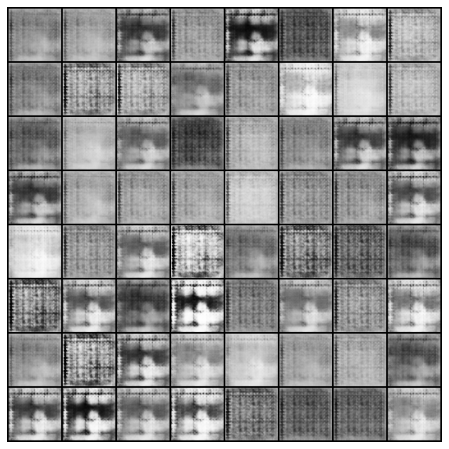

In [9]:
animate_gen_imgs()

# Trian : izif E

In [10]:
DC.eval()
D.eval()

kappa = 1.0
EC_losses = []

iters = 0
AE_img_list = []

def train_AE(epoch):
    global epochs
    global iters
    global EC_losses
    global AE_img_list
    
    # 인덱스 0부터 세기 시작
    # data[0].size():64x1x64x64(image) / data[1].size():64(label)
    for i,data in enumerate(data_loader,0):
        
        real_imgs = data[0].to(device)
        
        EC_optimizer.zero_grad()
        
        EC_validity = EC(real_imgs)
        
        fake_imgs = DC(EC_validity)
        
        _, real_features = D.forward(real_imgs)
        _, fake_features = D.forward(fake_imgs)
        
        
        # izif architecture
        imgs_loss = AE_criterion(real_imgs, fake_imgs)
        features_loss = AE_criterion(real_features, fake_features)
        EC_loss = imgs_loss + kappa*features_loss
        
        EC_loss.backward()
        EC_optimizer.step()
        
        # =============================================================
        # print
        # =============================================================
        print('[%d/%d][%d/%d]\n- E_loss: %.4f\n'
              %(epoch+1, epochs, i, len(data_loader), EC_loss.item()))
        
        # Save Losses for plotting later
        EC_losses.append(EC_loss.item())
        
        #Check how the generator is doing by saving G's output on noise_z
        if (iters % 500 == 0) or ((epoch == epochs-1) and (i == len(data_loader)-1)):
            with torch.no_grad():
                fake = DC(EC_validity).detach().cpu()
            AE_img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
        iters += 1
        
#torch.save(E.state_dict(), 'E.ckpt')

In [11]:
for epoch in range(epochs):
    train_AE(epoch)

[1/100][0/21]
- E_loss: 0.2007

[1/100][1/21]
- E_loss: 0.2021

[1/100][2/21]
- E_loss: 0.1754

[1/100][3/21]
- E_loss: 0.1530

[1/100][4/21]
- E_loss: 0.1585

[1/100][5/21]
- E_loss: 0.1685

[1/100][6/21]
- E_loss: 0.1541

[1/100][7/21]
- E_loss: 0.1354

[1/100][8/21]
- E_loss: 0.1642

[1/100][9/21]
- E_loss: 0.1165

[1/100][10/21]
- E_loss: 0.1573

[1/100][11/21]
- E_loss: 0.1452

[1/100][12/21]
- E_loss: 0.1315

[1/100][13/21]
- E_loss: 0.1269

[1/100][14/21]
- E_loss: 0.1246

[1/100][15/21]
- E_loss: 0.1083

[1/100][16/21]
- E_loss: 0.1250

[1/100][17/21]
- E_loss: 0.1163

[1/100][18/21]
- E_loss: 0.1235

[1/100][19/21]
- E_loss: 0.1312

[1/100][20/21]
- E_loss: 0.1280

[2/100][0/21]
- E_loss: 0.0890

[2/100][1/21]
- E_loss: 0.1055

[2/100][2/21]
- E_loss: 0.1336

[2/100][3/21]
- E_loss: 0.1273

[2/100][4/21]
- E_loss: 0.1198

[2/100][5/21]
- E_loss: 0.1190

[2/100][6/21]
- E_loss: 0.1188

[2/100][7/21]
- E_loss: 0.1152

[2/100][8/21]
- E_loss: 0.1231

[2/100][9/21]
- E_loss: 0.119

[13/100][0/21]
- E_loss: 0.0805

[13/100][1/21]
- E_loss: 0.0888

[13/100][2/21]
- E_loss: 0.0692

[13/100][3/21]
- E_loss: 0.1019

[13/100][4/21]
- E_loss: 0.0827

[13/100][5/21]
- E_loss: 0.0841

[13/100][6/21]
- E_loss: 0.0835

[13/100][7/21]
- E_loss: 0.1146

[13/100][8/21]
- E_loss: 0.1063

[13/100][9/21]
- E_loss: 0.0856

[13/100][10/21]
- E_loss: 0.0899

[13/100][11/21]
- E_loss: 0.0907

[13/100][12/21]
- E_loss: 0.0958

[13/100][13/21]
- E_loss: 0.0929

[13/100][14/21]
- E_loss: 0.0893

[13/100][15/21]
- E_loss: 0.1108

[13/100][16/21]
- E_loss: 0.0837

[13/100][17/21]
- E_loss: 0.1043

[13/100][18/21]
- E_loss: 0.0810

[13/100][19/21]
- E_loss: 0.0900

[13/100][20/21]
- E_loss: 0.0996

[14/100][0/21]
- E_loss: 0.0996

[14/100][1/21]
- E_loss: 0.0759

[14/100][2/21]
- E_loss: 0.0890

[14/100][3/21]
- E_loss: 0.0959

[14/100][4/21]
- E_loss: 0.0891

[14/100][5/21]
- E_loss: 0.0961

[14/100][6/21]
- E_loss: 0.0982

[14/100][7/21]
- E_loss: 0.0886

[14/100][8/21]
- E_loss: 0.1002


[24/100][15/21]
- E_loss: 0.0861

[24/100][16/21]
- E_loss: 0.0813

[24/100][17/21]
- E_loss: 0.0886

[24/100][18/21]
- E_loss: 0.0896

[24/100][19/21]
- E_loss: 0.0772

[24/100][20/21]
- E_loss: 0.0919

[25/100][0/21]
- E_loss: 0.0718

[25/100][1/21]
- E_loss: 0.0901

[25/100][2/21]
- E_loss: 0.0866

[25/100][3/21]
- E_loss: 0.0773

[25/100][4/21]
- E_loss: 0.1039

[25/100][5/21]
- E_loss: 0.1283

[25/100][6/21]
- E_loss: 0.0866

[25/100][7/21]
- E_loss: 0.0860

[25/100][8/21]
- E_loss: 0.0839

[25/100][9/21]
- E_loss: 0.0911

[25/100][10/21]
- E_loss: 0.0989

[25/100][11/21]
- E_loss: 0.0875

[25/100][12/21]
- E_loss: 0.0792

[25/100][13/21]
- E_loss: 0.1005

[25/100][14/21]
- E_loss: 0.0794

[25/100][15/21]
- E_loss: 0.0925

[25/100][16/21]
- E_loss: 0.1131

[25/100][17/21]
- E_loss: 0.0799

[25/100][18/21]
- E_loss: 0.0908

[25/100][19/21]
- E_loss: 0.0866

[25/100][20/21]
- E_loss: 0.1022

[26/100][0/21]
- E_loss: 0.0779

[26/100][1/21]
- E_loss: 0.0884

[26/100][2/21]
- E_loss: 0

[36/100][9/21]
- E_loss: 0.0965

[36/100][10/21]
- E_loss: 0.0916

[36/100][11/21]
- E_loss: 0.0892

[36/100][12/21]
- E_loss: 0.0877

[36/100][13/21]
- E_loss: 0.0881

[36/100][14/21]
- E_loss: 0.0890

[36/100][15/21]
- E_loss: 0.0849

[36/100][16/21]
- E_loss: 0.0837

[36/100][17/21]
- E_loss: 0.0957

[36/100][18/21]
- E_loss: 0.0867

[36/100][19/21]
- E_loss: 0.1072

[36/100][20/21]
- E_loss: 0.0921

[37/100][0/21]
- E_loss: 0.1167

[37/100][1/21]
- E_loss: 0.0927

[37/100][2/21]
- E_loss: 0.0883

[37/100][3/21]
- E_loss: 0.0843

[37/100][4/21]
- E_loss: 0.0846

[37/100][5/21]
- E_loss: 0.0794

[37/100][6/21]
- E_loss: 0.1037

[37/100][7/21]
- E_loss: 0.0838

[37/100][8/21]
- E_loss: 0.0854

[37/100][9/21]
- E_loss: 0.0895

[37/100][10/21]
- E_loss: 0.0823

[37/100][11/21]
- E_loss: 0.0753

[37/100][12/21]
- E_loss: 0.0982

[37/100][13/21]
- E_loss: 0.0918

[37/100][14/21]
- E_loss: 0.0843

[37/100][15/21]
- E_loss: 0.0895

[37/100][16/21]
- E_loss: 0.0929

[37/100][17/21]
- E_loss:

[48/100][3/21]
- E_loss: 0.1082

[48/100][4/21]
- E_loss: 0.0863

[48/100][5/21]
- E_loss: 0.0910

[48/100][6/21]
- E_loss: 0.0850

[48/100][7/21]
- E_loss: 0.0838

[48/100][8/21]
- E_loss: 0.0881

[48/100][9/21]
- E_loss: 0.0840

[48/100][10/21]
- E_loss: 0.0780

[48/100][11/21]
- E_loss: 0.0899

[48/100][12/21]
- E_loss: 0.0679

[48/100][13/21]
- E_loss: 0.0838

[48/100][14/21]
- E_loss: 0.0800

[48/100][15/21]
- E_loss: 0.1072

[48/100][16/21]
- E_loss: 0.1161

[48/100][17/21]
- E_loss: 0.0851

[48/100][18/21]
- E_loss: 0.1058

[48/100][19/21]
- E_loss: 0.0845

[48/100][20/21]
- E_loss: 0.0920

[49/100][0/21]
- E_loss: 0.0742

[49/100][1/21]
- E_loss: 0.0862

[49/100][2/21]
- E_loss: 0.0930

[49/100][3/21]
- E_loss: 0.0886

[49/100][4/21]
- E_loss: 0.0921

[49/100][5/21]
- E_loss: 0.0780

[49/100][6/21]
- E_loss: 0.0962

[49/100][7/21]
- E_loss: 0.0846

[49/100][8/21]
- E_loss: 0.0761

[49/100][9/21]
- E_loss: 0.0859

[49/100][10/21]
- E_loss: 0.1021

[49/100][11/21]
- E_loss: 0.083

[59/100][18/21]
- E_loss: 0.0755

[59/100][19/21]
- E_loss: 0.0887

[59/100][20/21]
- E_loss: 0.0816

[60/100][0/21]
- E_loss: 0.1026

[60/100][1/21]
- E_loss: 0.0830

[60/100][2/21]
- E_loss: 0.0830

[60/100][3/21]
- E_loss: 0.0873

[60/100][4/21]
- E_loss: 0.0984

[60/100][5/21]
- E_loss: 0.0921

[60/100][6/21]
- E_loss: 0.0867

[60/100][7/21]
- E_loss: 0.0890

[60/100][8/21]
- E_loss: 0.0809

[60/100][9/21]
- E_loss: 0.0914

[60/100][10/21]
- E_loss: 0.0870

[60/100][11/21]
- E_loss: 0.1092

[60/100][12/21]
- E_loss: 0.0756

[60/100][13/21]
- E_loss: 0.0813

[60/100][14/21]
- E_loss: 0.0889

[60/100][15/21]
- E_loss: 0.0757

[60/100][16/21]
- E_loss: 0.0928

[60/100][17/21]
- E_loss: 0.0778

[60/100][18/21]
- E_loss: 0.0976

[60/100][19/21]
- E_loss: 0.0717

[60/100][20/21]
- E_loss: 0.0993

[61/100][0/21]
- E_loss: 0.1060

[61/100][1/21]
- E_loss: 0.0769

[61/100][2/21]
- E_loss: 0.1019

[61/100][3/21]
- E_loss: 0.1099

[61/100][4/21]
- E_loss: 0.0836

[61/100][5/21]
- E_loss: 0.08

[71/100][12/21]
- E_loss: 0.0956

[71/100][13/21]
- E_loss: 0.0828

[71/100][14/21]
- E_loss: 0.1083

[71/100][15/21]
- E_loss: 0.0773

[71/100][16/21]
- E_loss: 0.0866

[71/100][17/21]
- E_loss: 0.1040

[71/100][18/21]
- E_loss: 0.0745

[71/100][19/21]
- E_loss: 0.0763

[71/100][20/21]
- E_loss: 0.0994

[72/100][0/21]
- E_loss: 0.0838

[72/100][1/21]
- E_loss: 0.0821

[72/100][2/21]
- E_loss: 0.0888

[72/100][3/21]
- E_loss: 0.0931

[72/100][4/21]
- E_loss: 0.0788

[72/100][5/21]
- E_loss: 0.0781

[72/100][6/21]
- E_loss: 0.0963

[72/100][7/21]
- E_loss: 0.0816

[72/100][8/21]
- E_loss: 0.0752

[72/100][9/21]
- E_loss: 0.0834

[72/100][10/21]
- E_loss: 0.0733

[72/100][11/21]
- E_loss: 0.0965

[72/100][12/21]
- E_loss: 0.0870

[72/100][13/21]
- E_loss: 0.0746

[72/100][14/21]
- E_loss: 0.0898

[72/100][15/21]
- E_loss: 0.0869

[72/100][16/21]
- E_loss: 0.0925

[72/100][17/21]
- E_loss: 0.0963

[72/100][18/21]
- E_loss: 0.0915

[72/100][19/21]
- E_loss: 0.0877

[72/100][20/21]
- E_loss

[83/100][6/21]
- E_loss: 0.0898

[83/100][7/21]
- E_loss: 0.0753

[83/100][8/21]
- E_loss: 0.0855

[83/100][9/21]
- E_loss: 0.0941

[83/100][10/21]
- E_loss: 0.0736

[83/100][11/21]
- E_loss: 0.0792

[83/100][12/21]
- E_loss: 0.0849

[83/100][13/21]
- E_loss: 0.0799

[83/100][14/21]
- E_loss: 0.0828

[83/100][15/21]
- E_loss: 0.0816

[83/100][16/21]
- E_loss: 0.0964

[83/100][17/21]
- E_loss: 0.0897

[83/100][18/21]
- E_loss: 0.1101

[83/100][19/21]
- E_loss: 0.0737

[83/100][20/21]
- E_loss: 0.0777

[84/100][0/21]
- E_loss: 0.0727

[84/100][1/21]
- E_loss: 0.0917

[84/100][2/21]
- E_loss: 0.0901

[84/100][3/21]
- E_loss: 0.0960

[84/100][4/21]
- E_loss: 0.0958

[84/100][5/21]
- E_loss: 0.0852

[84/100][6/21]
- E_loss: 0.0963

[84/100][7/21]
- E_loss: 0.0942

[84/100][8/21]
- E_loss: 0.1025

[84/100][9/21]
- E_loss: 0.0790

[84/100][10/21]
- E_loss: 0.0950

[84/100][11/21]
- E_loss: 0.1035

[84/100][12/21]
- E_loss: 0.0727

[84/100][13/21]
- E_loss: 0.0623

[84/100][14/21]
- E_loss: 0.

[95/100][0/21]
- E_loss: 0.0804

[95/100][1/21]
- E_loss: 0.0991

[95/100][2/21]
- E_loss: 0.0882

[95/100][3/21]
- E_loss: 0.0889

[95/100][4/21]
- E_loss: 0.0862

[95/100][5/21]
- E_loss: 0.0671

[95/100][6/21]
- E_loss: 0.0825

[95/100][7/21]
- E_loss: 0.0924

[95/100][8/21]
- E_loss: 0.0892

[95/100][9/21]
- E_loss: 0.0790

[95/100][10/21]
- E_loss: 0.0754

[95/100][11/21]
- E_loss: 0.0807

[95/100][12/21]
- E_loss: 0.0858

[95/100][13/21]
- E_loss: 0.0836

[95/100][14/21]
- E_loss: 0.0915

[95/100][15/21]
- E_loss: 0.1027

[95/100][16/21]
- E_loss: 0.0904

[95/100][17/21]
- E_loss: 0.0853

[95/100][18/21]
- E_loss: 0.0662

[95/100][19/21]
- E_loss: 0.0986

[95/100][20/21]
- E_loss: 0.0915

[96/100][0/21]
- E_loss: 0.0803

[96/100][1/21]
- E_loss: 0.0934

[96/100][2/21]
- E_loss: 0.0692

[96/100][3/21]
- E_loss: 0.0991

[96/100][4/21]
- E_loss: 0.0866

[96/100][5/21]
- E_loss: 0.0760

[96/100][6/21]
- E_loss: 0.0819

[96/100][7/21]
- E_loss: 0.0752

[96/100][8/21]
- E_loss: 0.0792


# Loss Graph

In [12]:
def plot_train_loss():
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(DC_losses, label="G")
    plt.plot(D_losses, label="D")
    plt.plot(EC_losses, label="E")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

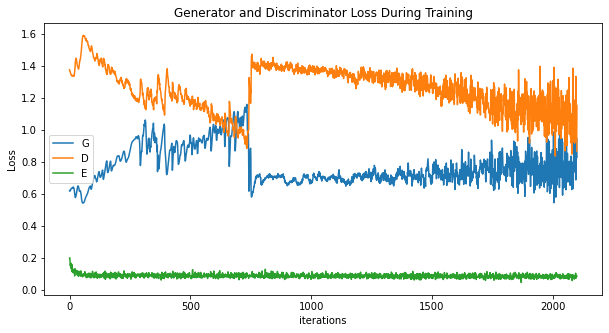

In [13]:
plot_train_loss()

---

# Test Data

In [14]:
#test_data_root = "../../dataset/test/test_DualPhaseSteel"
CFRP_test_data_root = "../../dataset/test/test_CFRP"

test_data_set = dataset.ImageFolder(root = CFRP_test_data_root, # test_data_root,
                           transform = transforms.Compose([
                                  transforms.Resize(img_size),
                                  transforms.CenterCrop(img_size),
                                  torchvision.transforms.Grayscale(channel),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5,),(0.5,))
                              ]))

# 배치로 나누고 셔플하기
test_data_loader = torch.utils.data.DataLoader(test_data_set, batch_size = 1,
                                              shuffle = False, num_workers = workers)

# 이상 픽셀 수 확인 함수

In [15]:
def count_el_not_0(diff_img):
    count_el_not_0 = 0
    
    col_size = diff_img.shape[0]
    row_size = diff_img.shape[1]
    
    #print(col_size, row_size)
    
    for col in range(col_size):
        for row in range(row_size):
            if diff_img[col][row] != 0:
                count_el_not_0 += 1
                
    return count_el_not_0

# img 비교 함수

In [16]:
def compare_imgs(real_img, generated_img, i, score, reverse=False, threshold=50):
    real_img = real_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    generated_img = generated_img.cpu().data.numpy().reshape(img_size, img_size) * 255
    
    negative = np.zeros_like(real_img)

    if not reverse:
        diff_img = real_img - generated_img
    else:
        diff_img = generated_img - real_img

    diff_img[diff_img <= threshold] = 0

    # 분율 추출
    diff_cnts.append(count_el_not_0(diff_img))
    # 분산 추출
    diff_points.append(np.where(diff_img > threshold))
    
    anomaly_img = np.zeros(shape=(img_size, img_size, 3))
    anomaly_img[:, :, 0] = real_img - diff_img
    anomaly_img[:, :, 1] = real_img - diff_img
    anomaly_img[:, :, 2] = real_img - diff_img
    anomaly_img[:, :, 0] = anomaly_img[:,:,0] + diff_img
    anomaly_img = anomaly_img.astype(np.uint8)

    # anomaly_img 추출
    anomaly_imgs.append(anomaly_img)
    
    fig, plots = plt.subplots(1, 4)

    fig.suptitle(f'Anomaly - (anomaly score: {score:.4})')
    
    fig.set_figwidth(9)
    fig.set_tight_layout(True)
    plots = plots.reshape(-1)
    plots[0].imshow(real_img, cmap='gray', label = "real")
    plots[1].imshow(generated_img, cmap='gray')
    plots[2].imshow(diff_img, cmap='gray')
    plots[3].imshow(anomaly_img)
    
    plots[0].set_title('real')
    plots[1].set_title('generated')
    plots[2].set_title('difference')
    plots[3].set_title('Anomaly Detection')
    plt.show()

# Test

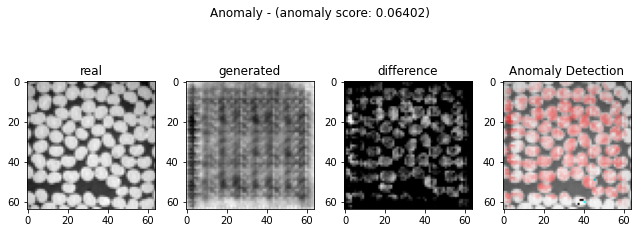

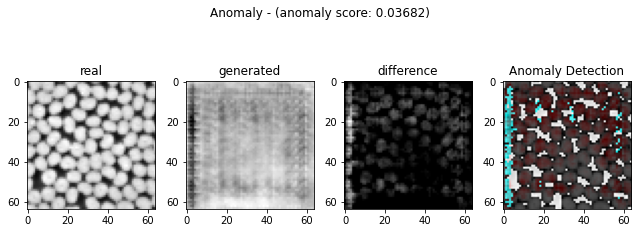

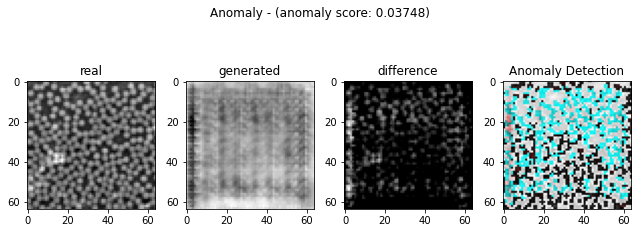

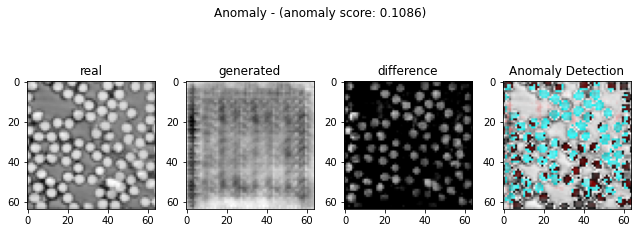

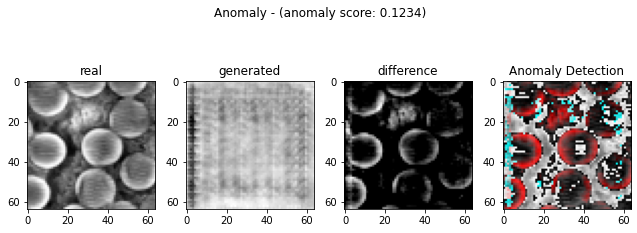

...

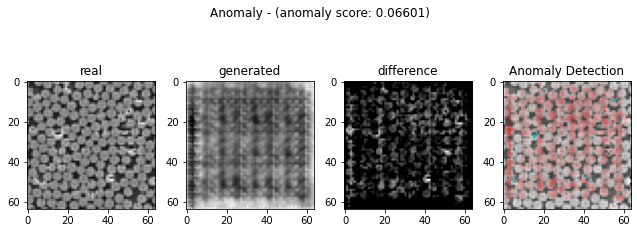

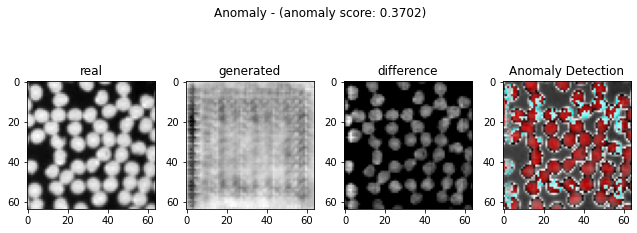

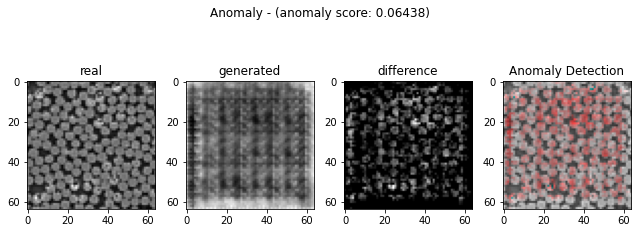

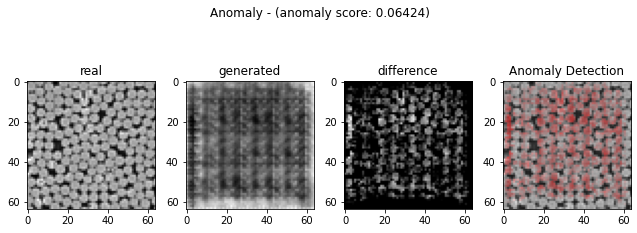

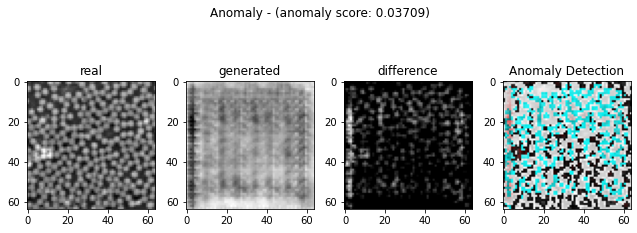

In [17]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

ano_criterion = nn.MSELoss()
DC.eval()
D.eval()
EC.eval()

# with open("score.csv", "w") as f:
#         f.write("label,img_distance,anomaly_score,z_distance\n")

for i, data in enumerate(test_data_loader, 0):
    real_img = data[0].to(device)

    real_z = EC(real_img) # 진짜 이미지의 latent vector
    fake_img = DC(real_z) # DC에 넣어서 가짜 이미지 생성.
    fake_z = EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

    _, real_feature = D.forward(real_img) # 1, 256
    _, fake_feature = D.forward(fake_img)

    img_distance = ano_criterion(fake_img, real_img)
    loss_feature = ano_criterion(fake_feature, real_feature)

    anomaly_score = img_distance + kappa*loss_feature

    z_distance = ano_criterion(fake_z, real_z)
    
#     with open("score.csv", "a") as f:
#             f.write(f"{label.item()},{img_distance},"
#                     f"{anomaly_score},{z_distance}\n")
            
#     print(f"{label.item()}, {img_distance}, "
#           f"{anomaly_score}, {z_distance}\n")
    compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

---

# 분율 추출

In [18]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.54418945 0.5534668  0.45117188 0.41381836 0.42602539 0.41015625
 0.47949219 0.56054688 0.4375     0.62939453 0.44555664 0.60058594
 0.44946289 0.35302734 0.53320312 0.47973633 0.50170898 0.53173828
 0.28857422 0.43261719 0.53125    0.46777344 0.49365234 0.51367188
 0.5637207  0.4543457  0.5546875  0.60717773 0.53173828 0.49462891
 0.43408203 0.46630859 0.49243164 0.52587891 0.46948242 0.46557617
 0.47241211 0.53979492 0.49047852 0.44702148 0.52294922 0.5012207
 0.57788086 0.53198242 0.49194336 0.54418945 0.53857422 0.46679688
 0.56469727 0.49780273 0.51391602 0.51538086 0.46484375 0.51269531
 0.59423828 0.52246094 0.49829102 0.51000977 0.54052734 0.47094727]


In [19]:
sum(diff_fraction)/len(diff_fraction)

0.4986572265625

---

# 분산 추출

In [20]:
from scipy import stats
from extended_int import int_inf

corr_coeffis = []
corr_p_vals = []

def cal_corr_coeffis():
    for idx in range(len(test_data_loader)):
        x_points = diff_points[idx][0]
        y_points = diff_points[idx][1]
        
        
        if len(x_points) > 0:
            corr_coeffi, corr_p_val = stats.pearsonr(x_points, y_points)
        else:
            corr_coeffi, corr_p_val = -int_inf, -int_inf
        
        corr_coeffis.append(corr_coeffi)
        corr_p_vals.append(corr_p_val)

In [21]:
cal_corr_coeffis()

print(corr_coeffis)

[0.039034274360282145, -0.019587352947823808, -0.06600869591783076, -0.023468431717080476, -0.054888070595800885, 0.0426385961823289, 0.03282527437049491, -0.013867625340304912, -0.03482952329912489, 0.029401078782559136, -0.16423304251249327, -0.02210525875835352, -0.012206756902921372, 0.02079266174429082, 0.07689653301311053, -0.013472733917500167, -0.06393975374818325, -0.08060355331623417, 0.3244672105653521, 0.056548397586456085, 0.008840831749435007, -0.03575073635240818, 0.0049477022245679285, -0.021902749370724457, 0.010409800774690402, -0.010423333185070542, -0.032520745878483505, 0.025398637869207402, -0.03748700323553279, -0.053644391088754864, 0.0217998303093364, -0.04525763131710961, -0.018730977146476407, 0.013446870662655182, -0.07197857631749466, -0.005495062609791788, 0.029922838932620908, 0.04265970195191894, -0.02283704445057959, 0.05460169876841017, -0.0014926749334740258, 0.03428023580344208, -0.00727754851332961, -0.003013034886009471, -0.01480676138836712, 0.004

---

# 모델 저장 및 읽기

In [22]:
save_file = "./pretrained/pretrained.pth"

def save_pretrained():
    pretrained = {
        "D" : D.state_dict(),
        "DC" : DC.state_dict(),
        "EC" : EC.state_dict()
    }

    if not os.path.isdir("pretrained"):
        os.mkdir("pretrained")
    torch.save(pretrained, save_file)

In [23]:
save_pretrained()

In [24]:
pretrained_D = Discriminator().to(device)
pretrained_DC = Decoder().to(device)
pretrained_EC = Encoder().to(device)

def load_pretrained():
    global pretrained_D
    global pretrained_DC
    global pretrained_EC
    
    assert os.path.isdir("pretrained"), "Error : no pretrained dir found!"
    
    pretrained = torch.load(save_file)
    
    pretrained_D.load_state_dict(pretrained["D"])
    pretrained_DC.load_state_dict(pretrained["DC"])
    pretrained_EC.load_state_dict(pretrained["EC"])
    
    #print("pretrained_D :", pretrained_D)
    #print("pretrained_G :", pretrained_DC)
    #print("pretrained_E :", pretrained_EC)

In [25]:
load_pretrained()

In [26]:
def test():
    ano_criterion = nn.MSELoss()
    pretrained_DC.eval()
    pretrained_D.eval()
    pretrained_EC.eval()

    # with open("score.csv", "w") as f:
    #         f.write("label,img_distance,anomaly_score,z_distance\n")

    for i, data in enumerate(test_data_loader, 0):
        real_img = data[0].to(device)

        real_z = pretrained_EC(real_img) # 진짜 이미지의 latent vector
        fake_img = pretrained_DC(real_z) # DC에 넣어서 가짜 이미지 생성.
        fake_z = pretrained_EC(fake_img) # torch.Size([1, 100]) --> latent 진짜 이미지와 매핑된 가짜 이미지의 latent vector

        _, real_feature = pretrained_D.forward(real_img) # 1, 256
        _, fake_feature = pretrained_D.forward(fake_img)

        img_distance = ano_criterion(fake_img, real_img)
        loss_feature = ano_criterion(fake_feature, real_feature)

        anomaly_score = img_distance + kappa*loss_feature

        z_distance = ano_criterion(fake_z, real_z)

    #     with open("score.csv", "a") as f:
    #             f.write(f"{label.item()},{img_distance},"
    #                     f"{anomaly_score},{z_distance}\n")

    #     print(f"{label.item()}, {img_distance}, "
    #           f"{anomaly_score}, {z_distance}\n")
        compare_imgs(real_img, fake_img, i, anomaly_score, reverse = False, threshold = 0.3)

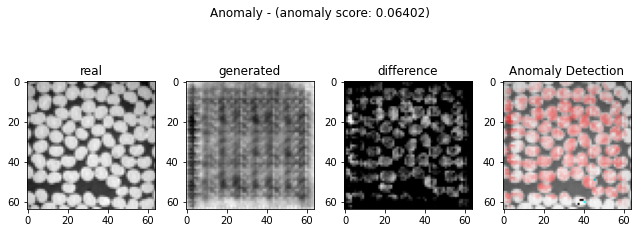

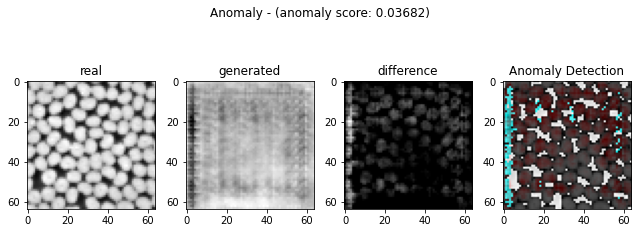

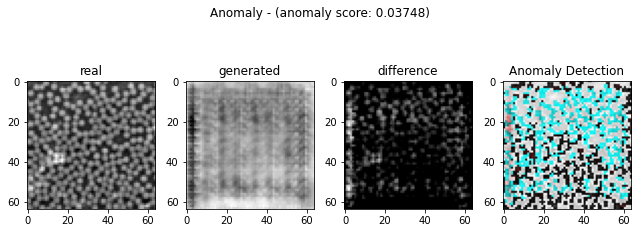

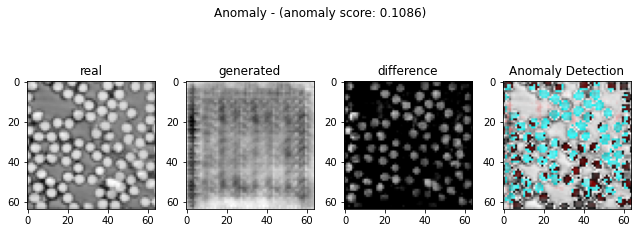

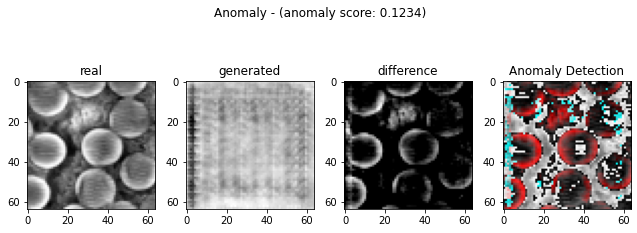

...

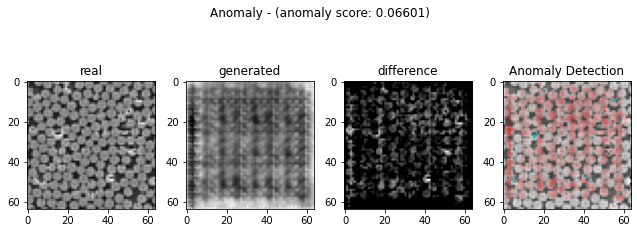

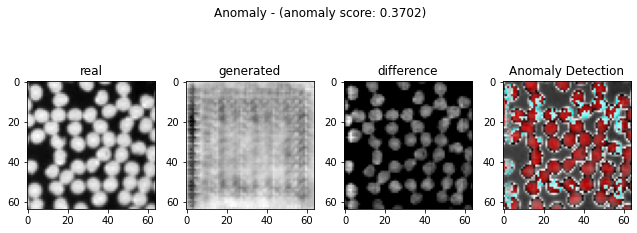

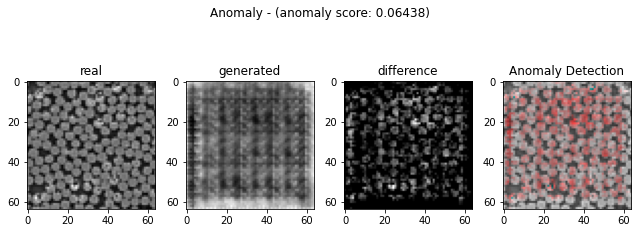

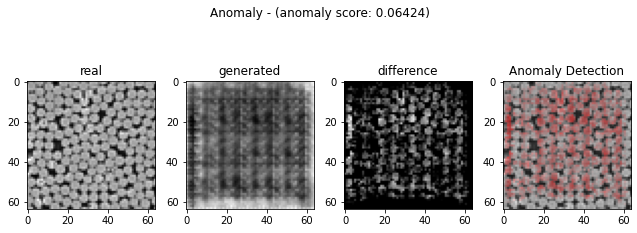

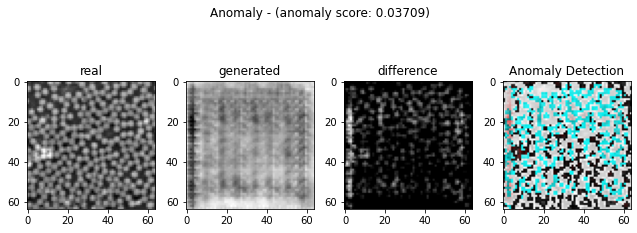

In [27]:
diff_cnts = []
diff_points = []
anomaly_imgs = []

corr_coeffis = []
corr_p_vals = []

test()

In [28]:
diff_cnts = np.array(diff_cnts)

diff_fraction = diff_cnts / img_size ** 2

print(diff_fraction)

[0.54418945 0.5534668  0.45117188 0.41381836 0.42602539 0.41015625
 0.47949219 0.56054688 0.4375     0.62939453 0.44555664 0.60058594
 0.44946289 0.35302734 0.53320312 0.47973633 0.50170898 0.53173828
 0.28857422 0.43261719 0.53125    0.46777344 0.49365234 0.51367188
 0.5637207  0.4543457  0.5546875  0.60717773 0.53173828 0.49462891
 0.43408203 0.46630859 0.49243164 0.52587891 0.46948242 0.46557617
 0.47241211 0.53979492 0.49047852 0.44702148 0.52294922 0.5012207
 0.57788086 0.53198242 0.49194336 0.54418945 0.53857422 0.46679688
 0.56469727 0.49780273 0.51391602 0.51538086 0.46484375 0.51269531
 0.59423828 0.52246094 0.49829102 0.51000977 0.54052734 0.47094727]


In [29]:
cal_corr_coeffis()

print(corr_coeffis)

[0.039034274360282145, -0.019587352947823808, -0.06600869591783076, -0.023468431717080476, -0.054888070595800885, 0.0426385961823289, 0.03282527437049491, -0.013867625340304912, -0.03482952329912489, 0.029401078782559136, -0.16423304251249327, -0.02210525875835352, -0.012206756902921372, 0.02079266174429082, 0.07689653301311053, -0.013472733917500167, -0.06393975374818325, -0.08060355331623417, 0.3244672105653521, 0.056548397586456085, 0.008840831749435007, -0.03575073635240818, 0.0049477022245679285, -0.021902749370724457, 0.010409800774690402, -0.010423333185070542, -0.032520745878483505, 0.025398637869207402, -0.03748700323553279, -0.053644391088754864, 0.0217998303093364, -0.04525763131710961, -0.018730977146476407, 0.013446870662655182, -0.07197857631749466, -0.005495062609791788, 0.029922838932620908, 0.04265970195191894, -0.02283704445057959, 0.05460169876841017, -0.0014926749334740258, 0.03428023580344208, -0.00727754851332961, -0.003013034886009471, -0.01480676138836712, 0.004

---

# anomaly detection 이미지 추출

In [30]:
anomaly_imgs

[array([[[188, 188, 188],
         [192, 192, 192],
         [194, 194, 194],
         ...,
         [180, 180, 180],
         [186, 186, 186],
         [186, 186, 186]],
 
        [[136, 136, 136],
         [180, 180, 180],
         [182, 182, 182],
         ...,
         [190, 190, 190],
         [184, 184, 184],
         [188, 188, 188]],
 
        [[186, 186, 186],
         [180, 180, 180],
         [127, 127, 127],
         ...,
         [188, 188, 188],
         [184, 184, 184],
         [190, 190, 190]],
 
        ...,
 
        [[180, 180, 180],
         [206, 206, 206],
         [206, 202, 202],
         ...,
         [226, 226, 226],
         [232, 232, 232],
         [150, 150, 150]],
 
        [[172, 172, 172],
         [113, 113, 113],
         [198, 173, 173],
         ...,
         [228, 221, 221],
         [218, 218, 218],
         [166, 166, 166]],
 
        [[188, 188, 188],
         [166, 166, 166],
         [222, 222, 222],
         ...,
         [226, 226, 226],
  

# 이미지 저장 함수

In [31]:
import cv2

def save_imgs(folder, imgs):
    if not os.path.isdir("anomaly_imgs"):
        os.mkdir("anomaly_imgs")
    
    for i in range(len(imgs)):
        cv2.imwrite('%s/%d.png' %(folder,i), imgs[i]) #이미지 저장할 경로 설정을 여기서 한다.
    print("image saving complete")

In [32]:
save_imgs("./anomaly_imgs", anomaly_imgs)

image saving complete


---

# 티타늄(Ti64) 상대 밀도 계산

In [33]:
Ti64_density = 4.43

Ti64_rel_densitys = np.array([])

Ti64_rel_densitys = diff_fraction * Ti64_density

print(Ti64_rel_densitys)

[2.41075928 2.45185791 1.99869141 1.83321533 1.88729248 1.81699219
 2.12415039 2.48322266 1.938125   2.78821777 1.97381592 2.6605957
 1.99112061 1.56391113 2.36208984 2.12523193 2.2225708  2.35560059
 1.27838379 1.91649414 2.3534375  2.07223633 2.18687988 2.27556641
 2.49728271 2.01275146 2.45726562 2.68979736 2.35560059 2.19120605
 1.9229834  2.06574707 2.18147217 2.32964355 2.07980713 2.06250244
 2.09278564 2.3912915  2.17281982 1.98030518 2.31666504 2.22040771
 2.56001221 2.35668213 2.17930908 2.41075928 2.38588379 2.06791016
 2.50160889 2.20526611 2.27664795 2.28313721 2.05925781 2.27124023
 2.63247559 2.31450195 2.2074292  2.25934326 2.39453613 2.08629639]
